## Задание
В данном задании вашей задачей будет построить простую модель для задачи **Image Captioning** - по изображению (image) сгенерировать текстовый заголовок (caption).
Задание проверяется в автоматическом режиме в Я.Контест.

В задании будет несколько оцениваемых частей:
1. **Подготовка данных для модели** (*4 балла*) --> требуется заполнить пропуски и составить пайплайн предобработки данных
2. **Построение модели** (*3 балла*) --> требуется заполнить пропуски и составить пайплайн сборки модели
3. **Обучение модели** (*3 балла*) --> требуется заполнить пропуски и составить пайплайн обучения модели
4. **Оценка результатов** (*2 балл*) --> требуется заполнить пропуски и получить предсказания модели
5. **Валидация качества** (*3+ баллов*) --> вам нужно будет обучить модель, чтобы превзойти определённые пороги на валидационной выборке. Эта часть задания подразумевает возможность получения дополнительных баллов: в остальном ноутбуке вы соберёте модель по некоторой моей рекомендации, а именно в этой части от вас мы ожидаем экспериментов. Попробуйте собрать свою модель, улучшить качество, попробовать другие архитектуры и концептуальные подходы, в общем - удачи! За хорошие попытки полагаются баллы сверх базовой стоимости дз.

**Структура данных:** 
- Вместе с заданием вам предложен файл __dataset.tar.gz__ (смотрите первую ячейку кода в ноутбуке), в нём вы найдёте папку data, в которой присутствуют две папки с изображениями (**train** и **val**) в формате .png и два файла **captions_train.tsv** и **captions_val.tsv**
- В файлах captions находятся таблицы с 6 полями, разделёнными через **\t**, содержащими `img_id` (название файла с изображением в соответствующей папке) и `caption #1-#5` (5 текстовых заголовков для изображения __img_id__)
- Не используйте val в обучении модели, только в тестах, т.к. часть баллов в конце будет выдаваться в зависимости от результатов вашей модели на test выборке, а проверка на val выборке - единственный способ оценки и само-проверки перед отправкой в контест на test замер

**Концепция простой модели**
- Будем рассматривать задачу предсказания следующего слова в предложении, имея изображение и предыдущие слова
- Для получения фичей из изображений будем использовать крупную свёрточную предобученную архитектуру
- Для получения фичей из текста будем использовать рекуррентную архитектуру с предобученными эмбеддингами, но чтобы передать внутрь этой модельки информацию из изображений будем в качестве hidden_0 передавать в них приведённые линейным слоем к нужному размеру фичи изображений
- Классификатор, завершающийся линейным слоем к размеру словаря над финальным набором фичей
- LogSoftmax + NLLLoss (или CrossEntropyLoss) для оценки предсказания

**Модели большие, подсчёты не быстрые - закладывайте время на обучение моделей**

**В ноутбуке будет какое-то количество assert-ов, их задача - подсказать вам, но совсем не всегда вы должны строго их проходить**

------------------------------

***Полезный комментарий:***

*Местами, в коде вы будете встречать выполнение bash скриптов - их легко распознать по комментарию `#!:bash` вверху ячейки.*

*Если вы пользуетесь датосферой, то оставьте как есть, всё сработает, а вот если Google colab или что-то ещё, то замените код скриптов так, чтобы каждая его строка начиналась с `!`.*

*К примеру:*

*Изначальный блок:*
```bash
#!:bash
ls -sh dataset.tar
file dataset.tar
```

*Заменённый блок:*
```bash
!ls -sh dataset.tar
!file dataset.tar
```

...вроде как сейчас второй вариант так же работает и в датасфере, но я не уверен

## 0. Скачиваем и распаковываем данные

In [1]:
import requests
from urllib.parse import urlencode

base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
public_key = 'https://disk.yandex.ru/d/W9EODR61Dj1Oxg'

# Получаем загрузочную ссылку
final_url = base_url + urlencode(dict(public_key=public_key))
response = requests.get(final_url)
download_url = response.json()['href']

# Загружаем файл и сохраняем его
download_response = requests.get(download_url)
with open('dataset.tar.gz', 'wb') as f:   # Здесь укажите нужный путь к файлу
    f.write(download_response.content)

## 1. Подготовка данных (***4 балла***)

In [2]:
#!:bash
!ls -sh dataset.tar.gz
!file dataset.tar.gz

2.2G dataset.tar.gz
dataset.tar.gz: gzip compressed data, from Unix, original size modulo 2^32 2370375680


In [3]:
#!:bash
!tar xfz dataset.tar.gz -C .

In [8]:
import torch
import cv2
import os
import pandas as pd
import numpy as np
from tqdm.auto import tqdm, trange
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
data_folder = "./data"  # укажите здесь путь до распакованных данных

dfs = dict()
for split in ['train', 'val']:
    dfs[split] = pd.read_csv(os.path.join(data_folder, f'captions_{split}.tsv'), sep='\t')

dfs['train'].head()

,img_id,caption #0,caption #1,caption #2,caption #3,caption #4
0,0000.png,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,0001.png,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,0002.png,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,0003.png,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,0004.png,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...


In [21]:
dfs['train'].shape

(6000, 6)

In [27]:
dfs['val'].shape

(500, 6)

<class 'numpy.ndarray'>
(500, 375, 3)


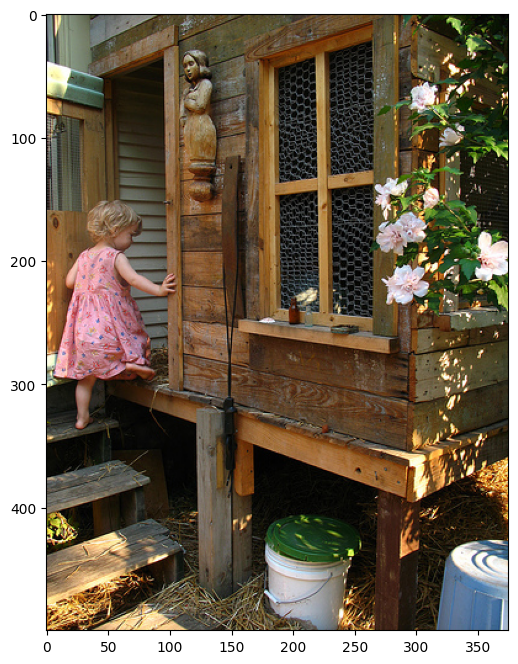

In [10]:
fig, ax = plt.subplots(figsize=(10,8))
# Для чтения изображений из файлов мы будем использовать библиотеку cv2 --> всё что вам нужно знать
#   функция cv2.imread(path) принимает на вход путь к файлу изображения и возвращает np.array с изображением
#   в порядке h x w x c
image = cv2.imread(os.path.join(data_folder, 'train', dfs['train'].iloc[0]['img_id']))
print(type(image))
print(image.shape)
plt.imshow(image)
plt.show()

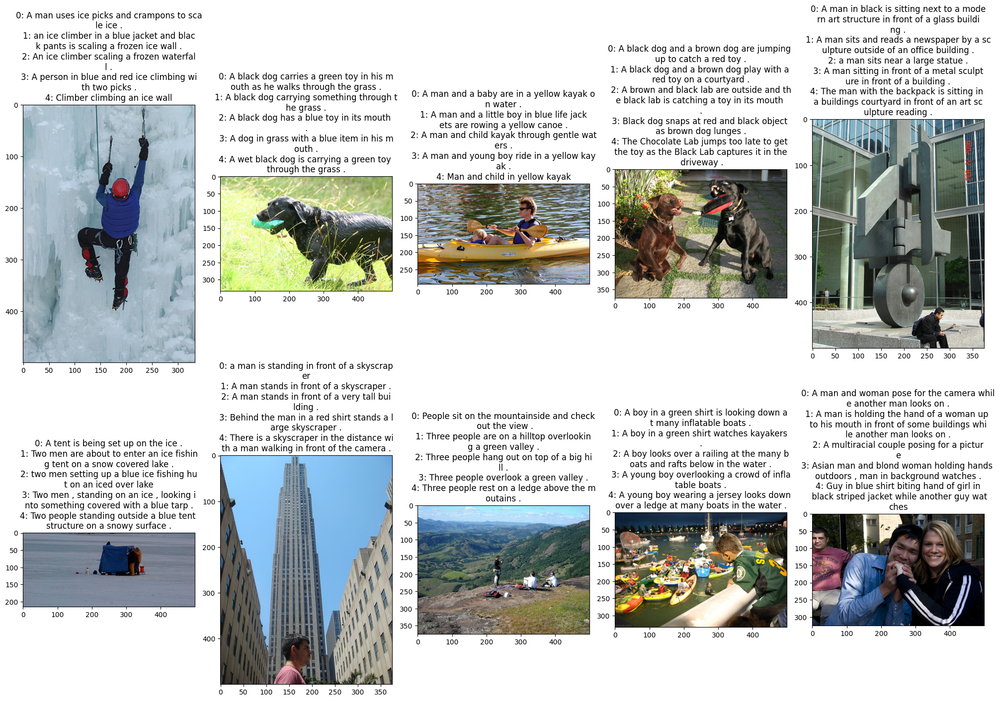

In [305]:
inds = list(range(20,30))
split = 'train'

h, w = 2, 5
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    captions = [row[f'caption #{i}'] for i in range(5)]
    
    caption_adjasted = map(lambda el: '\n'.join([(str(el[0]) + ': ' + el[1])[k:k+title_width] for k in range(0, 3 + len(el[1]), title_width)]), enumerate(captions))
    caption = '\n'.join(caption_adjasted)
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(cv2.imread(os.path.join(data_folder, split, img_id)))

fig.tight_layout()
plt.show()

### 1.2 Предобработка изображений

**Сперва напишем предобработку для изображений**

In [13]:
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2
from torchvision import transforms as tr

In [14]:
# Подготовьте функцию для аугументации одного изображения

# !!! Напомню, что в выборе аугументаций многое будет зависеть от того,
# !!!  на каких аугументациях училась предобученная модель, которую вы возьмёте,
# !!!  так что рекомендую принимать решение о финальных аугументациях после изучения
# !!!  выбранной вами модели

# Поканальное среднее и стандартное отклонение (как и откуда лучше взять?)
train_df = dfs['train']

# Списки для хранения значений пикселей по каналам
channel_sum = np.zeros(3)
channel_squared_sum = np.zeros(3)
num_pixels = 0

# Обход всех изображений
for img_id in tqdm(train_df['img_id']):
    img_path = os.path.join(data_folder, 'train', img_id)
    img = cv2.imread(img_path)  # BGR формат
    img = img.astype(np.float32) / 255.0  # Нормализация в [0,1]
    
    h, w, c = img.shape
    num_pixels += h * w

    # Суммируем значения по каналам
    channel_sum += img.sum(axis=(0, 1))
    channel_squared_sum += (img ** 2).sum(axis=(0, 1))

# Вычисляем среднее и стандартное отклонение
channel_mean = channel_sum / num_pixels
channel_std = np.sqrt(channel_squared_sum / num_pixels - channel_mean ** 2)


  0%|          | 0/6000 [00:00<?, ?it/s]

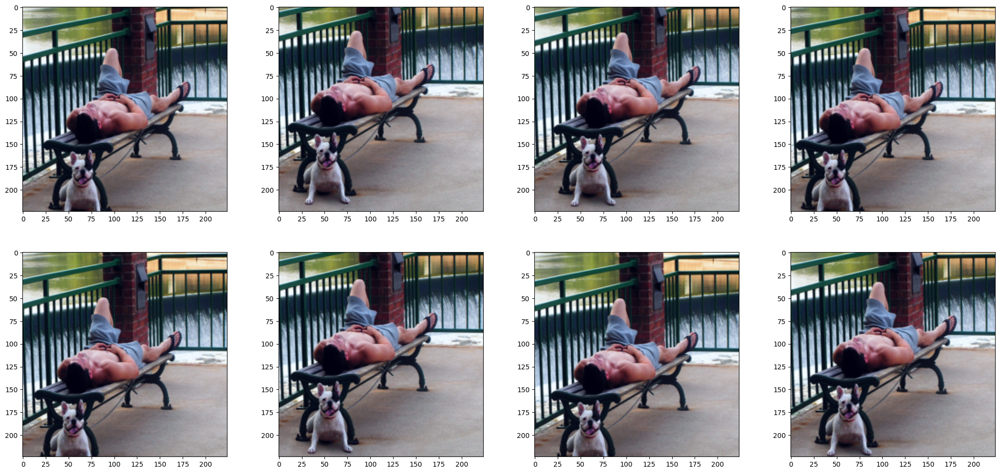

In [196]:
image_prepare = tr.Compose([
    tr.ToPILImage(),
    tr.Resize((256, 256)),  # Приведение всех изображений к 256x256
    tr.RandomCrop(224), #ВАЖНО делать рандомно, так как у каждого изображения есть 5 подписей, которые подаются в обучении рандомно. нельзя чтобы одно и то же изображение подавалось с разными выходами. если делать рандомно то одинаковых входов точно не будет
    #v2.RandomHorizontalFlip(0.5),  # Случайное отражение по горизонтали
    #v2.CenterCrop(224),  # Обрезка до 224x224 (размер для ResNet)
    #tr.RandomResizedCrop(size=(250, 250), antialias=True),
    #v2.RandomZoomOut(p=0.5, side_range=(1.0, 1.5)),
    #v2.RandomRotation(degrees=30, expand=True),
    tr.ToTensor(),
    tr.Normalize(mean=channel_mean, std=channel_std),
])

# Для валидации рекомендую использовать минимальное количество аугументаций, чтобы
#  замеряться честно - изменения размера, нормализация (все случайные аугументации
#  не делайте для валидации и обязательно для обучения делайте со средним в нуле)
image_prepare_val = tr.Compose([
    tr.ToPILImage(),
    tr.Resize((224, 224)),
    #v2.CenterCrop(224),
    tr.ToTensor(),
    tr.Normalize(mean=channel_mean, std=channel_std),
])


# Визуализация ваших преобразований на одном изображении (проверка на адекватность)
from sklearn.preprocessing import minmax_scale

image = cv2.imread(os.path.join(data_folder, "train", "0003.png"))

def de_normalize(img):
    return minmax_scale(
        (img.reshape(3, -1) + channel_mean[:, None]) * channel_std[:, None],
        feature_range=(0., 1.),
        axis=1,
    ).reshape(*img.shape)

# Проверка на адекватность
fig, ax = plt.subplots(2, 4, figsize=(26, 12))
for i in range(8):
    plt.subplot(2, 4, i+1)
    transformed_image = image_prepare(image).numpy().transpose(1, 2, 0)
    to_show_image = de_normalize(transformed_image)
    plt.imshow(to_show_image)
plt.show()

### 1.3 Предобработка заголовков

**Затем напишем предобработку для заголовков**

Для простоты вычислений предлагаю сделать крайне простую токенизацию, пользуясь регулярными выражениями и библиотекой **re**

1. Приводим текст к нижнему регистру
2. Заменяем всю пунктуацию на пробелы
3. Убираем пробельные символы с концов строки
4. Разбиваем по ненулевой последовательности пробельных символов
5. Добавляем специальные токены \<BOS> (begining of sentence) и \<EOS> (end of sentence), чтобы обозначить границы заголовка для модели

In [16]:
import re

def tokenize(text):
    text = text.lower()  # Приводим к нижнему регистру
    text = re.sub(r'[^\w\s]', ' ', text)  # Заменяем всю пунктуацию на пробелы
    text = text.strip()  # Убираем пробельные символы с концов строки
    tokens = re.split(r'\s+', text)  # Разбиваем по ненулевой последовательности пробелов
    return ['<BOS>'] + tokens + ['<EOS>']  # Добавляем специальные токены
# Проверка вашей функции
tokenize("My name is Any0019, I wish you good luck in this lab! Bye-bye :)")

['<BOS>',
 'my',
 'name',
 'is',
 'any0019',
 'i',
 'wish',
 'you',
 'good',
 'luck',
 'in',
 'this',
 'lab',
 'bye',
 'bye',
 '<EOS>']

Соберём словарь из всех слов, что встречаются в заголовках в train
1. Токенизируем заголовки
2. Обновляем частоту всех отдельных токенов
3. Выкидываем все слова встретившиеся меньше `MIN_FREQ` (допустим 3 - можете взять другое число) -> заменяем на специальный `<UNK>` (unknown) токен
4. Записываем быстрое преобразование из токенов в индексы и наоборот

  0%|          | 0/6000 [00:00<?, ?it/s]

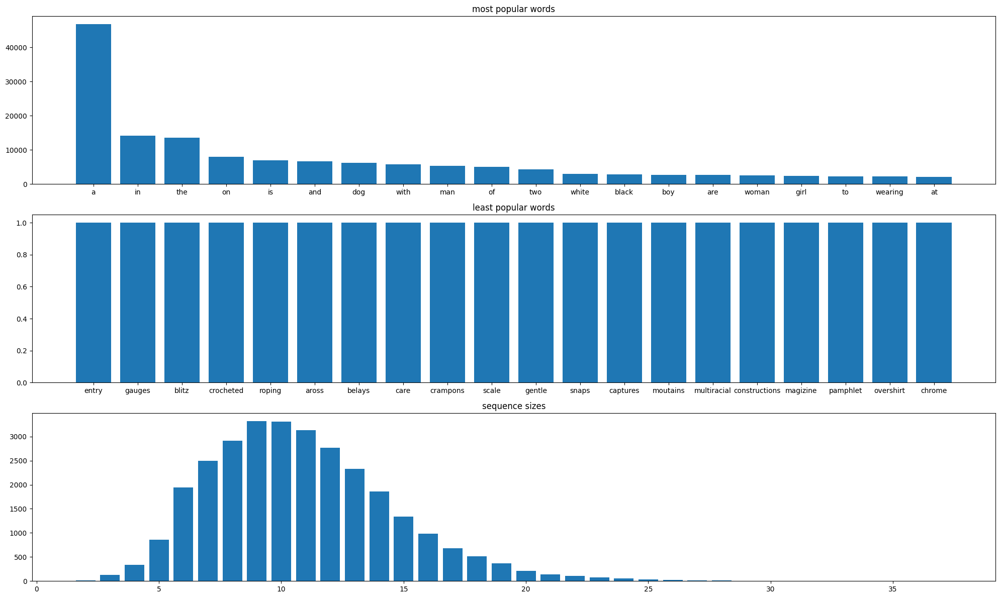

In [18]:
from tqdm.auto import trange
from collections import Counter

# Посчитаем частоту встречаемости различных токенов (не нужно для bos и eos)
vocab_freq = Counter()

# Параллельно заодно посчитаем длины заголовков в токенах (сколько раз встречалась какая длина в токенах)
#  sizes[5] = число заголовков из 5 токенов (без учёта bos и eos)
sizes = Counter()

for i in trange(len(dfs['train'])):
    for j in range(5):  # У нас 5 заголовков для каждого изображения
        caption = dfs['train'][f'caption #{j}'].iloc[i]
        tokens = tokenize(caption)
        sizes[len(tokens) - 2] += 1  # Без учета <BOS> и <EOS>
        vocab_freq.update(tokens[1:-1])  # Считаем только слова, без <BOS> и <EOS>

global_max_seq_len = np.max(list(sizes.keys()))

show_ = 20
fig, ax = plt.subplots(3, 1, figsize=(20, 12))

plt.subplot(312)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1])}
plt.title('least popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(311)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)}
plt.title('most popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(313)
plt.title('sequence sizes')
plt.bar(list(sizes.keys()), list(sizes.values()))

fig.tight_layout()
plt.show()

In [312]:
MIN_FREQ = 2  # токены с частотой ниже этой константы заменяются на <UNK>

# Так же добавляем <PAD> токен для паддингов
tok_to_ind = {
    '<UNK>': 0,
    '<BOS>': 1,
    '<EOS>': 2,
    '<PAD>': 3,
}

ind_to_tok = {
    0: '<UNK>',
    1: '<BOS>',
    2: '<EOS>',
    3: '<PAD>',
}

for token, freq in vocab_freq.items():
    if freq >= MIN_FREQ:
        index = len(tok_to_ind)
        tok_to_ind[token] = index
        ind_to_tok[index] = token

assert len(tok_to_ind) == len(ind_to_tok)
vocab_size = len(tok_to_ind)
print(f"Resulting vocab size: {vocab_size} (out of {len(vocab_freq)} tokens overall, due to MIN_FREQ={MIN_FREQ})")

Resulting vocab size: 4447 (out of 7370 tokens overall, due to MIN_FREQ=2)


In [313]:
# Функция возвращает по тексту индексы токенов в тексте
def to_ids(text):
    tokens = tokenize(text)
    return [tok_to_ind.get(token, tok_to_ind['<UNK>']) for token in tokens]

text = "I really hope that you can get a lot of great results with this lab! You're awesome! I believe in you, good luck :)"
toks = tokenize(text)
ids = to_ids(text)

print(list(zip(toks, ids)))

assert toks[0] == '<BOS>' and toks[-1] == '<EOS>'
assert ids[0] == tok_to_ind['<BOS>'] and ids[-1] == tok_to_ind['<EOS>']

[('<BOS>', 1), ('i', 1372), ('really', 2343), ('hope', 0), ('that', 153), ('you', 1173), ('can', 760), ('get', 373), ('a', 4), ('lot', 384), ('of', 13), ('great', 2469), ('results', 0), ('with', 11), ('this', 313), ('lab', 1052), ('you', 1173), ('re', 0), ('awesome', 0), ('i', 1372), ('believe', 0), ('in', 5), ('you', 1173), ('good', 2454), ('luck', 0), ('<EOS>', 2)]


### 1.4 Датасет

**Сделаем класс датасета в стиле torch.utils.data.Dataset**

In [69]:
dfs['train']

,img_id,caption #0,caption #1,caption #2,caption #3,caption #4
0,0000.png,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,0001.png,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,0002.png,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,0003.png,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,0004.png,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...
...,...,...,...,...,...,...
5995,5995.png,one brown and white dog chasing a black and wh...,The two dogs are running through the grass .,Two cocker spaniels running through the grass .,Two dogs are running through a green yard,Two dogs are running through the grass near a ...
5996,5996.png,A man does a wheelie on his bicycle on the sid...,A man is doing a wheelie on a mountain bike .,A man on a bicycle is on only the back wheel .,Asian man in orange hat is popping a wheelie o...,Man on a bicycle riding on only one wheel .
5997,5997.png,A group is sitting around a snowy crevasse .,A group of people sit atop a snowy mountain .,A group of people sit in the snow overlooking ...,Five children getting ready to sled .,Five people are sitting together in the snow .
5998,5998.png,A grey bird stands majestically on a beach whi...,A large bird stands in the water on the beach .,A tall bird is standing on the sand beside the...,A water bird standing at the ocean 's edge .,A white crane stands tall as it looks out upon...


In [314]:
import random
class ImageCaptioningDataset(Dataset):
    """
        imgs_path ~ путь к папке с изображениями
        captions_path ~ путь к .tsv файлу с заголовками изображений
    """
    def __init__(self, imgs_path, captions_path, train=True):
        super(ImageCaptioningDataset).__init__()
        self.imgs_path = imgs_path
        self.train = train
        self.data = pd.read_csv(captions_path, sep='\t')
        
        self.train_transform = image_prepare
        
        self.val_transform = image_prepare_val
        
        # Читаем и записываем из файлов в память класса, чтобы быстро обращаться внутри датасета
        # Если не хватает памяти на хранение всех изображений, то подгружайте прямо во время __getitem__, но это замедлит обучение
        # Проведите всю предобработку, которую можно провести без потери вариативности датасета, здесь
        ...

    def __getitem__(self, index):
        
        # Получаем предобработанное изображение (не забудьте отличие при train=True или train=False)
        img_id = self.data.iloc[index]['img_id']
        img_path = os.path.join(self.imgs_path, img_id)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        transform = self.train_transform if self.train else self.val_transform
        img = transform(img)
        
        # Берём все заголовки или только один случайный (случайность должна происходить при каждом вызове __getitem__, 
        #  чтобы во время обучения вы в разных эпохах могли видеть разные заголовки для одного изображения)

        captions = [self.data.iloc[index][f'caption #{i}'] for i in range(5)]
        caption = random.choice(captions) if self.train else captions[0]
        caption_ids = to_ids(caption)  # Преобразуем текст в индексы
        
        
        return img, caption_ids
    
    def __len__(self):
        return len(self.data)

In [315]:
ds_train = ImageCaptioningDataset(
    os.path.join(data_folder, 'train'),
    os.path.join(data_folder, f'captions_train.tsv'),
    train=True,
)

ds_val = ImageCaptioningDataset(
    os.path.join(data_folder, 'val'),
    os.path.join(data_folder, f'captions_val.tsv'),
    train=False,
)

In [268]:
img1, captions1 = ds_train[0]
img2, captions2 = ds_train[1]

# Изображения должны быть тензорами (желательно одного размера для удобства складывания в батч)
assert isinstance(img1, torch.Tensor)
assert isinstance(img2, torch.Tensor)
assert img1.shape == img2.shape  # может быть не так, только если вы понимаете что делаете
assert img1.shape[0] == 3
print(f"Размер изображения из датасета: {img1.shape}")

# На этом этапе предлагаю возвращать просто list-ы captions без паддинга
#assert isinstance(captions1, list)
#assert isinstance(captions2, list)

# Если вы возвращаете все или >1 заголовков для каждого изображения
#assert isinstance(captions1[0], list) and len(captions1) == len(captions2)
#assert isinstance(captions1[0][0], int)
#assert ind_to_tok[captions1[0][0]] == "<BOS>"
#assert ind_to_tok[captions1[0][-1]] == "<EOS>"
#print(f"Число заголовков для одного изображения: {len(captions1)}")

# Если вы возвращаете 1 случайный заголовок для каждого изоброажения
assert isinstance(captions1[0], int)
assert ind_to_tok[captions1[0]] == "<BOS>"
assert ind_to_tok[captions1[-1]] == "<EOS>"

# Проверка что число элементов в датасете совпадает с соответствующим числом изображений
assert len(ds_train) == len(os.listdir(os.path.join(data_folder, 'train')))
assert len(ds_val) == len(os.listdir(os.path.join(data_folder, 'val')))

Размер изображения из датасета: torch.Size([3, 224, 224])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000000000000002].


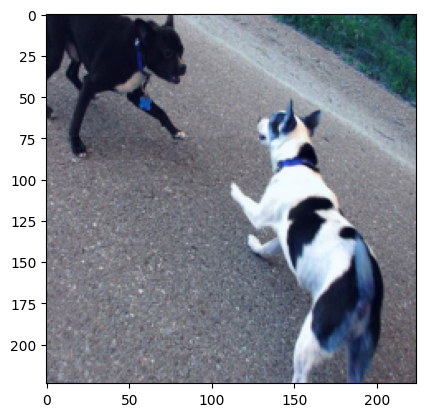

In [269]:
# Проверка на адекватность
plt.imshow(
    de_normalize(img2.numpy().transpose(1, 2, 0))
)
plt.show()

### 1.5 Даталоадер

In [316]:
# Здесь хотим задать кастомную функцию для того, как именно складывать данные в батч
# Эта функция позже будет передана в collate_fn аргумент даталоадера и будет отвечать за то,
#  как обработать батч и превратить его в тензоры нужного вида
from torch.nn.utils.rnn import pad_sequence

def collate_fn(batch):
    # Функция получает на вход batch - представляет из себя List[el], где каждый el - один вызов __getitem__
    #  вашего датасета
    # На выход вы выдаёте то, что будет выдавать Dataloader на каждом next() из генератора - вы хотите иметь на выходе
    #  несколько тензоров
    
    # Моё предложение по тому как должен выглядеть батч на выходе:
    #   img_batch: [batch_size, num_channels, height, width] --> сложенные в батч изображения
    #   captions_batch: [batch_size, num_captions_per_image, max_seq_len or local_max_seq_len] --> сложенные в
    #       батч заголовки при помощи padding-а
    ...

    # Разделяем батч на изображения и заголовки
    imgs, captions = zip(*batch)
    
    # Объединяем изображения в тензор (размер: [batch_size, C, H, W])
    img_batch = torch.stack(imgs)
    
    # Токенизируем заголовки и находим их длины
    tokenized_captions = [torch.tensor(caption, dtype=torch.long) for caption in captions]
    
    # Заполняем короткие заголовки паддингами <PAD>
    captions_batch = torch.nn.utils.rnn.pad_sequence(
        tokenized_captions, batch_first=True, padding_value=tok_to_ind['<PAD>']
    )
    
    return img_batch, captions_batch

In [317]:
batch_size = 64
num_workers = 0

dataloader_train = DataLoader(
    dataset=ds_train,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers,
)

dataloader_val = DataLoader(
    dataset=ds_val,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers,
)

In [276]:
img_batch, captions_batch = next(iter(dataloader_train))

assert isinstance(img_batch, torch.Tensor)
assert isinstance(captions_batch, torch.Tensor)

assert img_batch.shape[:2] == torch.Size([batch_size, 3])
assert captions_batch.shape[0] == batch_size
assert len(captions_batch.shape) in [2, 3]

assert isinstance(captions_batch.reshape(-1)[0].item(), int)

print("Размер батча изображений: {}\nРазмер батча заголовков: {}".format(img_batch.shape, captions_batch.shape))

Размер батча изображений: torch.Size([64, 3, 224, 224])
Размер батча заголовков: torch.Size([64, 34])


## 2. Составляем модель (***3 балла***)

[Картинка предложенной архитектуры модели для понимания](https://disk.yandex.ru/i/sHzk7LBP8-A5aQ)

<img src="https://disk.yandex.ru/i/sHzk7LBP8-A5aQ">

### 2.1 Фича-экстрактор для изображений

Возьмите какую-нибудь предобученную модель (к примеру resnet), по желанию заморозьте все или часть слоёв, наиболее вероятно уберите последний слой

```python
# выбрать веса нужной вам модели
weights = models.ResNet18_Weights.DEFAULT

# скачать нужную архитекутру модели и инициализировать её весами
model = models.resnet18(weights=weights, progress=True)

# посмотреть какие аугументации использовались в данной модели
weights.transforms()
```

In [256]:
from torchvision import models
from torch import nn

# Загружаем предобученную ResNet18
weights = models.ResNet18_Weights.DEFAULT  # Веса обучены на ImageNet
resnet = models.resnet18(weights=weights)  # Загружаем предобученные веса


In [165]:
transform = weights.transforms()
transform

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [306]:
class img_fe_class(nn.Module):
    def __init__(self, train_last_block=True):
        super(img_fe_class, self).__init__()
        weights = models.ResNet18_Weights.DEFAULT
        self.model = models.resnet18(weights=weights)
        
        for param in self.model.parameters():
            param.requires_grad = False 
            
        if train_last_block:
            for param in self.model.layer4.parameters():
                param.requires_grad = True
            for param in self.model.layer3.parameters():
                param.requires_grad = True
                
        self.model = nn.Sequential(*list(self.model.children())[:-1])  # Убираем последний слой
    
    def forward(self, imgs):
        features = self.model(imgs)
        features = features.view(features.size(0), -1)  # Разворачиваем в вектор
        return features

In [307]:
img_fe = img_fe_class()
    
img_features = img_fe(img_batch)

assert len(img_features.shape) == 2
assert img_features.shape[0] == img_batch.shape[0]

print(f'Для изображения возвращает {img_features.shape[1]} фичей')

Для изображения возвращает 512 фичей


### 2.2 Фича-экстрактор для текста

Давайте скачаем предобученные glove вектора и инициализируем nn.Embedding ими, там где мы их знаем

In [33]:
import urllib.request
import zipfile
import os

# URL-адрес файла
url = "https://huggingface.co/stanfordnlp/glove/resolve/main/glove.840B.300d.zip"
filename = "glove.zip"

# Скачиваем файл
urllib.request.urlretrieve(url, filename=filename)



('glove.zip', <http.client.HTTPMessage at 0x7f2860106500>)

In [35]:
import zipfile

# Путь к файлу
zip_path = "glove.zip"
extract_path = "glove_vectors"  # Папка, куда разархивируем

# Разархивируем
with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Файлы извлечены в {extract_path}")


Файлы извлечены в glove_vectors


In [318]:
# Открываем glove
np.random.seed(19)

def load_glove_weights(file_path, vocab, pad_token="<PAD>"):
    print("Loading Glove Weights")
    # Инициализируем веса для всех слов стандартным нормальным распределением
    glove_weights = np.random.uniform(0, 1, (len(vocab), 300))
    mask_found = np.zeros(len(vocab), dtype=bool)
    
    # Ищем среди слов в предобученном glove слова из нашего словаря
    with open(file_path, 'r', encoding="utf-8") as f:
        for line in tqdm(f, total=2196018):
            line = line.split()
            token = ' '.join(line[:-300])
            embed = line[-300:]

            # Если нашли, то подменяем эмбеддинг из glove
            if token in vocab:
                ind = vocab[token]
                mask_found[ind] = True
                glove_weights[ind, :] = np.array(list(map(float, embed)), dtype=np.float64)

    print(f"{mask_found.sum()} words from vocab of size {len(vocab)} loaded!")

    glove_weights[vocab[pad_token]] = np.zeros(300, dtype=np.float64)
    return glove_weights, mask_found


glove_path = "glove_vectors/glove.840B.300d.txt"
glove_weights, mask_found = load_glove_weights(glove_path, tok_to_ind, "<PAD>")

Loading Glove Weights


  0%|          | 0/2196018 [00:00<?, ?it/s]

4435 words from vocab of size 4447 loaded!


In [321]:
glove_weights_loaded = np.loadtxt("glove.tsv", delimiter="\t")
len(glove_weights_loaded)

3478

-----

Теперь, давайте составим рекурентную модельку для получения фичей из текстов с учётом картинок

Используйте эмбеддинги из картинок в качестве начального состояния скрытого слоя рекурентной нейросети (h_0), если размерности не совпадают, то линейный слой вам в помощь. Если в вашей rnn-like ячейке несколько слоёв, то подавайте в каждый из них.

Вам может пригодиться:

1. библиотека einops - один из самых удобных способов перетасовывать размерности в тензорах, пример:
```python
from einops import rearrange

a = torch.zeros(batch_size, num_captions, max_seq_length, emb_size)
b = rearrange(a, "bs cap seq emb -> (bs cap) seq emb")  # (batch_size * num_captions, max_seq_length, emb_size)
c = rearrange(b, "(bs cap) seq emb -> bs cap seq emb", cap=num_captions)  # (batch_size, num_captions, max_seq_length, emb_size)
```

2. torch.Tensor.repeat() - размножить тензор вдоль одной из размерностей, пример:
```python
a = torch.zeros(3, 5)
b = a[None, :, None, :]  # (1, 3, 1, 5)
c = b.repeat(2, 1, 4, 2)  # (2, 3, 4, 10)
```

In [310]:
class text_fe_class(nn.Module):
    def __init__(self, vocab_size, glove_weights, hidden_size, num_layers=1):
        super(text_fe_class, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        self.embed = nn.Embedding(num_embeddings=vocab_size, embedding_dim=300, padding_idx=tok_to_ind['<PAD>'])
        self.embed.weight = nn.Parameter(
            torch.from_numpy(glove_weights).to(dtype=self.embed.weight.dtype),
            requires_grad=True,
        )
        self.fc = nn.Linear(512, hidden_size)
        self.gru = nn.GRU(input_size=300, hidden_size=hidden_size, num_layers=num_layers, batch_first=True, bidirectional=False, dropout=0.2 if num_layers > 1 else 0)
        #self.lstm = nn.LSTM(input_size=300, hidden_size=hidden_size, num_layers=num_layers, batch_first=True, bidirectional = False)
        self.fc_out = nn.Linear(hidden_size, vocab_size)
        
        
    def forward(self, texts, img_features):
        img_features = self.fc(img_features)    
        #c_0 = img_features.unsqueeze(0).repeat(self.num_layers, 1, 1)  # [num_layers*2, batch_size, hidden_size]
        #h_0 = torch.zeros_like(c_0)  # Нули
        h_0 = img_features.unsqueeze(0).repeat(self.num_layers, 1, 1)

        text_embeds = self.embed(texts)  # [batch_size, seq_len, 300]
        #text_features, _ = self.lstm(text_embeds, (h_0, c_0))
        text_features, _ = self.gru(text_embeds, h_0)
        logits = self.fc_out(text_features)
        return text_features

In [325]:
vocab_size = len(tok_to_ind)
hidden_size = 1024


text_fe = text_fe_class(vocab_size, glove_weights, hidden_size)
text_features = text_fe(captions_batch, img_features)

assert text_features.shape[:-1] == captions_batch.shape
assert len(text_features.shape) in [3, 4]
assert len(text_features.shape) == len(captions_batch.shape) + 1

print(captions_batch.shape)
print(img_features.shape)
print(text_features.shape)

torch.Size([64, 34])
torch.Size([64, 512])
torch.Size([64, 34, 1024])


### 2.3 Финальная модель

In [337]:
from collections import OrderedDict

class image_captioning_model(nn.Module):
    def __init__(self, vocab_size, glove_weights, hidden_size, num_layers=1):
        super(image_captioning_model, self).__init__()
        self.image_encoder = img_fe_class()
        self.text_decoder = text_fe_class(vocab_size, glove_weights, hidden_size, num_layers)
        
        self.hidden_fc = nn.Linear(hidden_size, hidden_size)  # Новый скрытый слой
        self.relu = nn.ReLU()  # Активация
        self.dropout = nn.Dropout(0.3)  # Dropout для регуляризации
        #self.ln_out = nn.LayerNorm(hidden_size)  # LayerNorm перед выходным слоем
        
        self.fc_out = nn.Linear(hidden_size, vocab_size)  # Финальный слой
        
    def forward(self, img_batch, texts_batch):
        img_features = self.image_encoder(img_batch)  # Получаем вектор изображения
        text_features = self.text_decoder(texts_batch, img_features)  # Пропускаем через LSTM

        text_features = self.hidden_fc(text_features)  # Новый слой
        #text_features = self.ln_out(text_features)
        text_features = self.relu(text_features)  # Активация
        text_features = self.dropout(text_features)
        
        output = self.fc_out(text_features)  # Проекция в пространство словаря
        return output

In [322]:
len(tok_to_ind)

4447

In [338]:
vocab_size = len(tok_to_ind)
hidden_size = 512
model = image_captioning_model(vocab_size, glove_weights, hidden_size)

res = model(img_batch, captions_batch)

assert res.shape[:-1] == captions_batch.shape
assert res.shape[-1] == vocab_size

print(res.shape)

torch.Size([64, 34, 4447])


In [330]:
from termcolor import colored
from collections import defaultdict

def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))

# Считаем общее число параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = np.prod(param.shape)
        if verbose_all or (verbose_only_learnable and param[1].requires_grad):
            print(
                colored(
                    '{: <42} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param[1].requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )
    
    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params


sum_params, sum_learnable_params = model_num_params(model)

image_encoder.model.0.weight               ~  9.408     params ~ grad: False
image_encoder.model.1.weight               ~  64        params ~ grad: False
image_encoder.model.1.bias                 ~  64        params ~ grad: False
image_encoder.model.4.0.conv1.weight       ~  36.864    params ~ grad: False
image_encoder.model.4.0.bn1.weight         ~  64        params ~ grad: False
image_encoder.model.4.0.bn1.bias           ~  64        params ~ grad: False
image_encoder.model.4.0.conv2.weight       ~  36.864    params ~ grad: False
image_encoder.model.4.0.bn2.weight         ~  64        params ~ grad: False
image_encoder.model.4.0.bn2.bias           ~  64        params ~ grad: False
image_encoder.model.4.1.conv1.weight       ~  36.864    params ~ grad: False
image_encoder.model.4.1.bn1.weight         ~  64        params ~ grad: False
image_encoder.model.4.1.bn1.bias           ~  64        params ~ grad: False
image_encoder.model.4.1.conv2.weight       ~  36.864    params ~ grad: False

## 3. Пайплайн обучения (***3 балла***)

### 3.1 Оптимайзер

In [339]:
import torch.optim as optim
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, learning_rate=1e-3, weight_decay=1e-5, warmup_epochs=5, device=device):
    model = model_class(**model_params)
    model = model.to(device)
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay = weight_decay)

    def warmup_fn(epoch):
        if epoch < warmup_epochs:
            return (epoch + 1) / warmup_epochs  # Линейный рост от 0 до 1
        return 1.0  # После warm-up оставляем lr как есть
        
    warmup_scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=warmup_fn)
    
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, min_lr=1e-6)
    return model, optimizer, warmup_scheduler, scheduler



### 3.2 Один шаг обучения/валидации

Помните что captions вы используете и как input (`captions[..., seq->0:-1, ...]`) в модель и как target (`captions[..., seq->1:None, ...]`)

In [340]:
from collections import defaultdict

def train(model, opt, loader, criterion):
    model.train()
    losses_tr = []
    for img_batch, captions_batch in tqdm(loader):
        img_batch = img_batch.to(device)
        captions_batch = captions_batch.to(device)
        
        optimizer.zero_grad()
        
        pred = model(img_batch, captions_batch[:, :-1])  # Вход без <EOS>
        target = captions_batch[:, 1:]  # Сдвигаем вправо, чтобы предсказания соответствовали ожидаемым токенам
        
        # Приводим к нужным размерам
        pred = pred.view(-1, pred.shape[-1])  # [batch_size * (seq_len - 1), vocab_size]
        target = target.contiguous().view(-1)  # [batch_size * (seq_len - 1)]
        
        
        loss = criterion(pred, target)
        
        loss.backward()
        optimizer.step()
        losses_tr.append(loss.item())
    
    return model, optimizer, np.mean(losses_tr)


def val(model, loader, criterion, metric_names=None):
    model.eval()
    losses_val = []
    if metric_names is not None:
        metrics = defaultdict(list)
    with torch.no_grad():
        for img_batch, captions_batch in tqdm(loader):
            img_batch = img_batch.to(device)
            captions_batch = captions_batch.to(device)
            
            pred = model(img_batch, captions_batch[:, :-1])  # Вход без <EOS>
            target = captions_batch[:, 1:]  # Сдвигаем вправо, чтобы предсказания соответствовали ожидаемым токенам
            
            # Приводим к нужным размерам
            pred = pred.view(-1, pred.shape[-1])  # [batch_size * (seq_len - 1), vocab_size]
            target = target.contiguous().view(-1)  # [batch_size * (seq_len - 1)]
            
            
            loss = criterion(pred, target)

            losses_val.append(loss.item())
            
            # Можете добавить сюда любые метрики, которые хочется (см. код здесь и 3.3 за подробностями)
            if metric_names is not None:
                if 'accuracy' in metric_names:
                    preds = torch.argsort(pred, dim=-1, descending=True)
                    for k in metric_names["accuracy"]["top"]:
                        metrics[f'accuracy ~ top#{k}'].append(
                            np.mean([target[i] in preds[i, :k] for i in range(target.shape[0])])
                        )

        if metric_names is not None:
            for name in metrics:
                metrics[name] = np.mean(metrics[name])
    
    return np.mean(losses_val), metrics if metric_names else None

### 3.3 Цикл обучения

In [341]:
from IPython.display import clear_output
import warnings
import time
from datetime import timedelta

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer,
    train_loader,
    val_loader,
    criterion,
    warmup_scheduler,
    warmup_epochs,
    scheduler,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    separate_show=False,
    model_name=None,
    chkp_folder="./chkps",
    metric_names=None,
):
    # Выбираем куда будем сохранять модель
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed = True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
        
    # Инициализируем переменные
    losses = {'train': [], 'val': []}
    lrs = []
    best_val_loss = np.inf
    if metric_names is not None:
        metrics = defaultdict(list)
    start_time = time.monotonic()

    # Цикл обучения
    for epoch in range(1, epochs+1):
        print(f'#{epoch}/{epochs}:')

        lrs.append(get_lr(optimizer))
        
        model, optimizer, loss = train(model, optimizer, train_loader, criterion)
        losses['train'].append(loss)

        # Каждые val_every эпох проводим валидацию
        if not (epoch % val_every):
            loss, metrics_ = val(model, val_loader, criterion, metric_names=metric_names)
            losses['val'].append(loss)
            if metrics_ is not None:
                for name, value in metrics_.items():
                    metrics[name].append(value)
            
            # Сохраняем лучшую по валидации модель
            if loss < best_val_loss:
                if not os.path.exists(chkp_folder):
                    os.makedirs(chkp_folder)
                torch.save(
                    {
                        'epoch': epoch,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'scheduler_state_dict': scheduler.state_dict(),
                        'losses': losses,
                    },
                    os.path.join(chkp_folder, model_name + '.pt'),
                )
                best_val_loss = loss
            
            # Шаг шедулера
            if epoch <= warmup_epochs:
                warmup_scheduler.step()
            else:
                scheduler.step(loss)

        # Каждые draw_every эпох рисуем графики
        if not (epoch % draw_every):
            clear_output(True)
            ww = 3 if separate_show else 2
            ww_metrics = 0
            if metric_names is not None:
                plot_ids_ = [
                    [key, metric_meta.get("plot_id", 1), metric_meta]
                    for key, metric_meta
                    in metric_names.items()
                ]
                ww_metrics = len(set(el[1] for el in plot_ids_))
                assert all(isinstance(el[1], int) for el in plot_ids_)
                assert all(el[1] <= ww_metrics for el in plot_ids_)
                assert all(el[1] >= 1 for el in plot_ids_)
                
                plot_ids = defaultdict(list)
                for el in plot_ids_:
                    plot_ids[el[1]].append((el[0], el[2]))
                
            fig, ax = plt.subplots(1, ww + ww_metrics, figsize=(30, 10))
            fig.suptitle(f'#{epoch}/{epochs} ~ {timedelta(seconds=time.monotonic() - start_time)}')

            plt.subplot(1, ww + ww_metrics, 1)
            plt.plot(losses['train'], 'r.-', label='train')
            if separate_show:
                plt.title('loss on train')
                plt.legend()
            plt.grid()

            if separate_show:
                plt.subplot(1, ww + ww_metrics, 2)
                plt.title('loss on validation')
                plt.grid()
            else:
                plt.title('losses')
            plt.plot(losses['val'], 'g.-', label='val')
            plt.legend()
            
            plt.subplot(1, ww + ww_metrics, ww)
            plt.title('learning rate')
            plt.plot(lrs, 'g.-', label='lr')
            plt.yscale("log")
            plt.legend()
            plt.grid()
            
            if metric_names is not None:
                for plot_id, keys_meta in plot_ids.items():
                    aggregated_meta = {}
                    plt.subplot(1, ww + ww_metrics, ww + plot_id)
                    if len(keys_meta) > 1:
                        plt.title(f'additional metrics #{plot_id}')
                    elif len(keys_meta) == 1:
                        plt.title(keys_meta[0][0])
                    for key_meta in keys_meta:
                        key, meta = key_meta
                        for meta_key in ["yscale"]:
                            if meta_key in meta:
                                assert meta_key not in aggregated_meta, f"Bad meta data '{meta_key}' doubled inside one plot_id ({plot_id})"
                                aggregated_meta[meta_key] = meta[meta_key]
                        for name in metrics:
                            if key in name:
                                plt.plot(metrics[name], '.-', label=name)
                    plt.yscale(aggregated_meta.get("yscale", "linear"))
                    plt.legend()
                    plt.grid()
            plt.show()
        
        # early_stopping - останавливаем обучение, если LR упал ниже min_lr
        if min_lr and get_lr(optimizer) <= min_lr:
            print(f'Learning process ended with early stop after epoch {epoch}')
            break
    
    return model, optimizer, losses

### 3.4 Обучаем модель

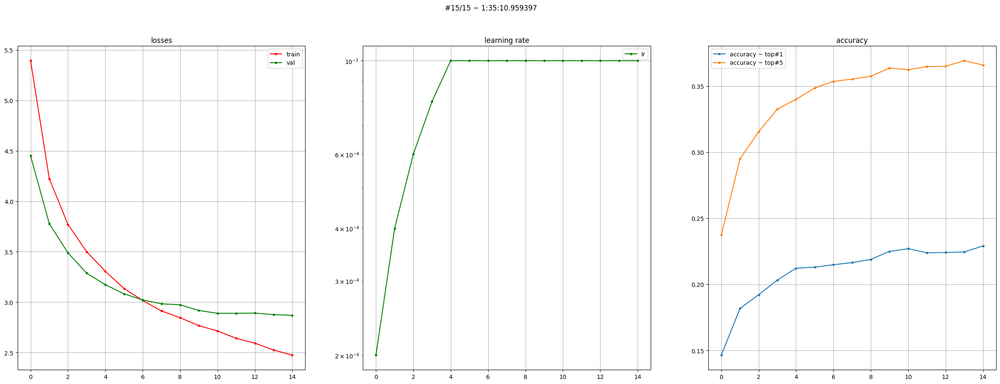

CPU times: user 18h 9min 59s, sys: 16min 27s, total: 18h 26min 26s
Wall time: 1h 35min 11s


In [342]:
%%time

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer, warmup_scheduler, scheduler = create_model_and_optimizer(
    image_captioning_model,
    model_params={"vocab_size": vocab_size, "glove_weights": glove_weights, "hidden_size": 1024},
    learning_rate=1e-3,
    weight_decay=1e-5,
    warmup_epochs=5,
    device=device
)

criterion = nn.CrossEntropyLoss(ignore_index=tok_to_ind['<PAD>'])

model, optimizer, losses = learning_loop(
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    warmup_scheduler = warmup_scheduler,
    warmup_epochs = 5,
    scheduler = scheduler,
    epochs = 15,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    separate_show = False,
    metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "default",
)

### 3.5 Загрузка чекпоинта

#### **Не запускайте этот блок, если не понимаете для чего это в данную секунду!**

#### **Так можно случайно перезатереть несколько часов вычислений, если не скопировать их в отдельную переменную/чекпоинт**

In [230]:
#assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"
import torch
import os
model_name = "default#8"
checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"), weights_only=False)

# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer, warmup_scheduler, scheduler = create_model_and_optimizer(
    image_captioning_model,
    model_params={"vocab_size": vocab_size, "glove_weights": glove_weights, "hidden_size": 1024},
    learning_rate=1e-3,
    weight_decay=1e-5,
    device=device
)

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
epoch = checkpoint['epoch']
losses = checkpoint['losses']

## 4. Оценка результатов (***2 балл***)

### 4.1 Генерация

In [335]:
from typing import Optional
import torch
import torch.nn.functional as F

def generate(
    model,
    image,
    max_seq_len: Optional[int] = 20,
    top_p: Optional[float] = None,
    top_k: Optional[int] = None,
):
    """
    По картинке image генерируем текст моделью model либо пока не сгенерируем '<EOS>' токен, либо пока не достигнем max_seq_len.
    
    Аргументы:
        model: обученная модель
        image: входное изображение (тензор)
        max_seq_len: максимальная длина сгенерированного текста
        tok_to_ind: словарь {токен -> индекс}
        ind_to_tok: словарь {индекс -> токен}
        top_k: если не None, выбираем среди top_k наиболее вероятных токенов
        top_p: если не None, выбираем среди токенов, суммарная вероятность которых <= top_p
    
    Возвращает:
        result_tokens: список индексов токенов
        result_text: сгенерированный текст
    """

    model.eval()
    device = next(model.parameters()).device

    with torch.no_grad():
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        image = torch.tensor(image.copy(), dtype=torch.float32).permute(2, 0, 1)
        
        image = image.unsqueeze(0).to(device)  # [1, 3, 224, 224]
        result_tokens = [tok_to_ind['<BOS>']]

        for _ in range(max_seq_len):
            input_tensor = torch.tensor(result_tokens, device=device).unsqueeze(0)  # [1, len_seq]
            logits = model(image, input_tensor)[:, -1, :]  # Берём логиты последнего токена

            probs = F.softmax(logits, dim=-1).squeeze(0)  # [vocab_size]

            # Применяем top-k или top-p
            if top_k is not None:
                top_k_values, top_k_indices = torch.topk(probs, top_k)
                top_k_probs = top_k_values / top_k_values.sum()
                next_token = torch.multinomial(top_k_probs, 1).item()
                next_token = top_k_indices[next_token].item()

            elif top_p is not None:
                sorted_probs, sorted_indices = torch.sort(probs, descending=True)
                cumulative_probs = torch.cumsum(sorted_probs, dim=0)
                filtered_indices = sorted_indices[cumulative_probs <= top_p]
                filtered_probs = probs[filtered_indices] / probs[filtered_indices].sum()
                next_token = filtered_indices[torch.multinomial(filtered_probs, 1)].item()

            else:
                next_token = torch.argmax(probs).item()
                #next_token = torch.multinomial(probs, 1).item()

            result_tokens.append(next_token)

            if next_token == tok_to_ind['<EOS>']:
                break

        result_text = " ".join(ind_to_tok[idx] for idx in result_tokens[1:])  # Исключаем <BOS>

    return result_tokens, result_text


In [ ]:
from typing import Optional

def generate(
    model,
    image,
    max_seq_len: Optional[int] = max_seq_len,
    top_p: Optional[float] = None,
    top_k: Optional[int] = None,
):
    """
    По картинке image генерируете текст моделью model либо пока не сгенерируете '<EOS>' токен, либо пока не сгенерируете max_seq_len токенов
        top_k -> после получения предсказания оставляете первые top_k слов и сэмплируете случайно с перенормированными вероятностями из оставшихся слов
        top_p -> после получения предсказания оставляете первые сколько-то слов, так, чтобы суммарная вероятность оставшихся слов была не больше top_p,
            после чего сэмплируете с перенормированными вероятностями из оставшихся слов
        иначе -> сэмплируете случайное слово с предсказанными вероятностями
    """
    assert top_p is None or top_k is None, "Don't use top_p and top_k at the same time"
    
    model.eval()
    
    with torch.no_grad():
        ...
        return result_tokens, result_text

### 4.2 Посмотрим на предсказания модели

In [66]:
def wrap_text(text, max_width):
    words = text.split(" ")
    result = [[words[0]]]
    for word in words[1:]:
        if len(" ".join(result[-1])) + len(word) + 1 > max_width:
            result[-1] = " ".join(result[-1])
            result.append([])
        result[-1].append(word)
    result[-1] = " ".join(result[-1])
    return "\n".join(result)

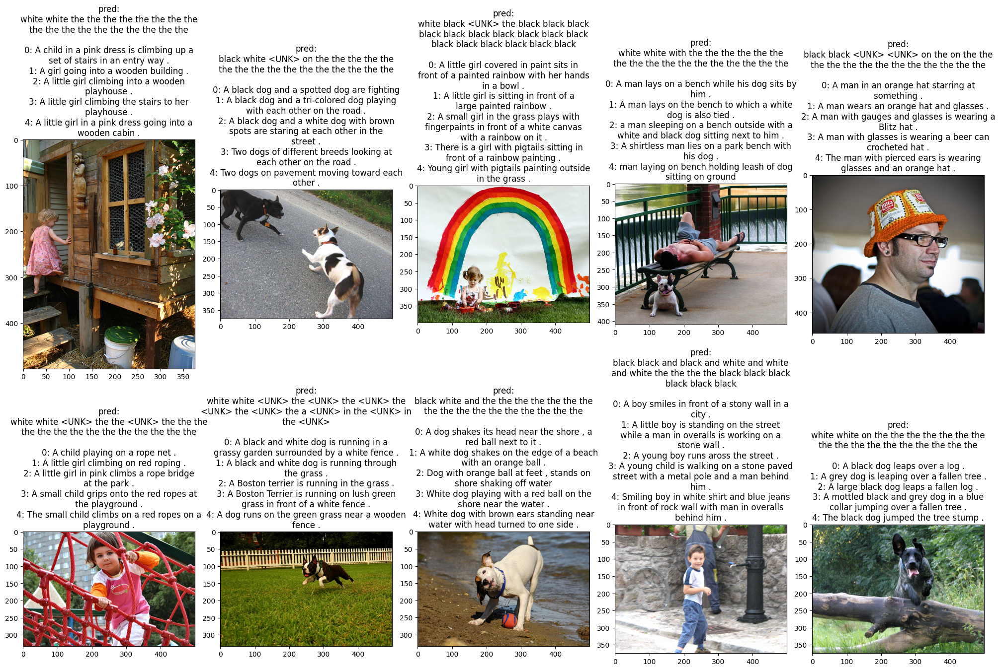

In [343]:
inds = list(range(10))
split = 'train'

h, w = 2, 5
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    img = cv2.imread(os.path.join(data_folder, split, img_id))
    
    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)
    
    captions = [row[f'caption #{i}'] for i in range(5)]
    caption_adjasted = "\n".join([f"{i}: " + wrap_text(caption, title_width) for i, caption in enumerate(captions)])
    
    caption = 'pred:\n' + pred_caption + '\n\n' + caption_adjasted
    
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

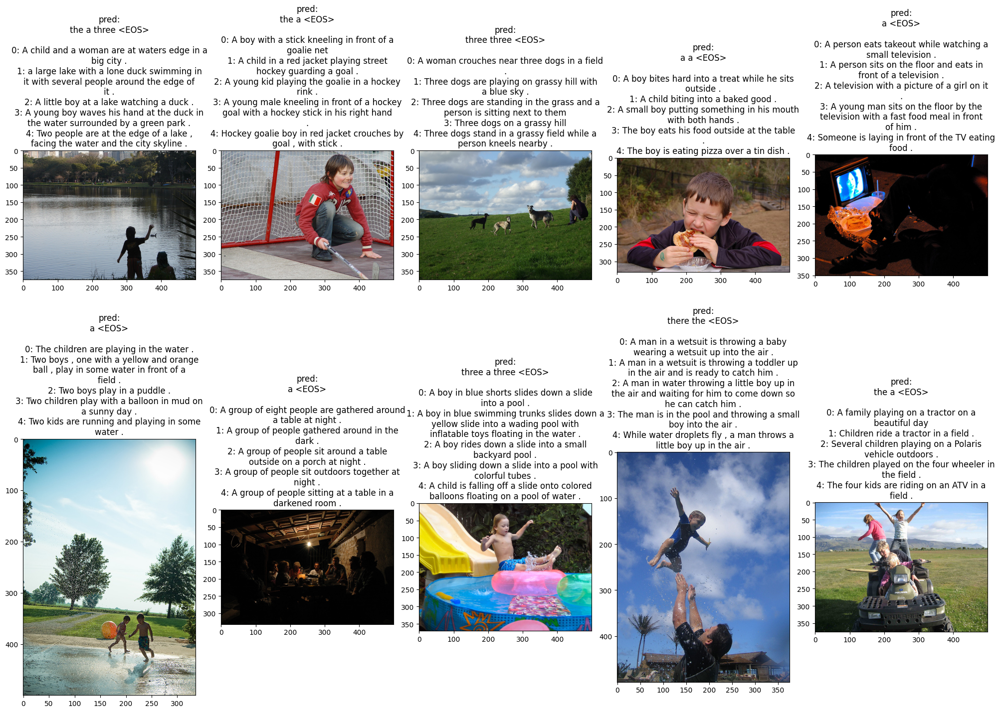

In [173]:
inds = list(range(10))
split = 'val'

h, w = 2, 5
title_width = 43

top_p = None
top_k = 3

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    img = cv2.imread(os.path.join(data_folder, split, img_id))
    
    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)
    
    captions = [row[f'caption #{i}'] for i in range(5)]
    caption_adjasted = "\n".join([f"{i}: " + wrap_text(caption, title_width) for i, caption in enumerate(captions)])
    
    caption = 'pred:\n' + pred_caption + '\n\n' + caption_adjasted
    
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

### 4.3 BLEU на всём val датасете

Тут код уже написан, эта функция будет использоваться в контесте для проверки ваших результатов.

Используйте её для само-проверки на валидационном сете

In [91]:
from torchtext.data.metrics import bleu_score

def get_bleu(model, top_p=None, top_k=None, split="val"):
    candidates = []
    references = []
    for ind, row in tqdm(dfs[split].iterrows(), total=dfs[split].shape[0]):
        img_id = row['img_id']
        img = cv2.imread(os.path.join(data_folder, split, img_id))
        references.append([tokenize(row[f'caption #{j}'])[1:-1] for j in range(5)])
        candidates.append([ind_to_tok[ind] for ind in generate(model, img, top_p=top_p, top_k=top_k)[0]])

    # Здесь считается взвешенный BLEU score по 1-4-граммам, оставьте именно так
    b1, b2, b3, b4 = (
        bleu_score(candidates, references, weights=(1, 0, 0, 0)),
        bleu_score(candidates, references, weights=(0, 1, 0, 0)),
        bleu_score(candidates, references, weights=(0, 0, 1, 0)),
        bleu_score(candidates, references, weights=(0, 0, 0, 1)),
    )
    return (
        # (b1, b2, b3, b4),
        (b1 + b2 + b3 + b4) / 4,  # Вам нужно добиться большого вот этого значения (см раздел 5.)
        # bleu_score(candidates, references),
    )

In [174]:
# В том числе экспериментируйте с top_p, top_k и прочим
bleu_res = get_bleu(model, top_p=None, top_k=None)
print(bleu_res)

  0%|          | 0/500 [00:00<?, ?it/s]

(0.0,)


## 5. Эксперименты (***3+ баллов***)

В этой части у вас не будет никакого написанного мною кода, а всё что вы здесь будете делать - на ваше усмотрение и по вашей задумке

Цель эксперментов:
**Пройти порог score в соревновании на отложенном тестовом сете**

На Test датасете вам нужно преодолеть следующие пороги:

**0.1** --> **1 балл**

**0.2** --> **2 балла**

**0.3** --> **3 балла**

В зависимости от решений других студентов пороги могут измениться, а за самые лучшие решения мы можем добавить дополнительные баллы.

**Удачи!**